## Google Play Store

The data from Play Store applications has huge potential for driving app-making businesses to success. Developers may use actionable information to build on and grab the Android market. This project will dive into some of the insights that may be drawn from this data collection.

In [ ]:
#import neccesary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px

warnings.filterwarnings('ignore')

In [ ]:
filename = 'googleplaystore.csv'
df= pd.read_csv(filename)
df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [ ]:
#Rename all columns
df.rename(columns = {'App':'app', 'Category':'category', 
                        'Rating': 'rating', 'Reviews':'reviews', 'Size':'size',
                         'Installs':'installs','Type':'type', 'Price':'price',
                          'Content Rating':'content_rating', 'Genres':'genres', 'Last Updated':'last_updated',
                           'Current Ver':'current_version', 'Android Ver': 'android_version'}, inplace = True)

In [ ]:
df.shape

(10841, 13)

In [ ]:
df.isnull().sum()

app                   0
category              0
rating             1474
reviews               0
size                  0
installs              0
type                  1
price                 0
content_rating        1
genres                0
last_updated          0
current_version       8
android_version       3
dtype: int64

In [ ]:
#Drop all null values
df = df.dropna()

In [ ]:
df = df.replace(['3.0M'],3000000)
df.drop(df[df['price'] == 'Everyone'].index, inplace = True)

In [ ]:
df.dtypes

app                 object
category            object
rating             float64
reviews             object
size                object
installs            object
type                object
price               object
content_rating      object
genres              object
last_updated        object
current_version     object
android_version     object
dtype: object

In [ ]:
#The data types needs to be addressed

df['reviews']= df.reviews.astype(int)
df['price'] = df['price'].str.replace('$', '').astype(float)
df['installs']= df['installs'].apply(lambda x:str(x).replace('+','') if'+'in str(x)else str(x))
df['installs']= df['installs'].apply(lambda x:str(x).replace(',','') if','in str(x)else str(x))
df['installs']= df['installs'].apply(lambda x:float(x))

In [ ]:
df['last_updated'] = pd.to_datetime(df['last_updated'])
df['last_updated'].head().reset_index()

,index,last_updated
0,0,2018-01-07
1,1,2018-01-15
2,2,2018-08-01
3,3,2018-06-08
4,4,2018-06-20


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
rating,9360.0,4.191838e+00,5.152630e-01,1.0,4.00,4.3,4.5,5.000000e+00
reviews,9360.0,5.143767e+05,3.145023e+06,1.0,186.75,5955.0,81627.5,7.815831e+07
installs,9360.0,1.790875e+07,9.126637e+07,1.0,10000.00,500000.0,5000000.0,1.000000e+09
price,9360.0,9.612788e-01,1.582164e+01,0.0,0.00,0.0,0.0,4.000000e+02


In [ ]:
#Extracting both the year and month from the 'Last Updated' column
df['lastupdated_year'] = df.last_updated.dt.strftime('%Y')
df['lastupdated_month'] = df.last_updated.dt.strftime('%B')

In [ ]:
import altair as alt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [ ]:
df.head()

,app,category,rating,reviews,size,installs,type,price,content_rating,genres,last_updated,current_version,android_version,lastupdated_year,lastupdated_month
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,10000.0,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up,2018,January
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,500000.0,Free,0.0,Everyone,Art & Design;Pretend Play,2018-01-15,2.0.0,4.0.3 and up,2018,January
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,5000000.0,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up,2018,August
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,50000000.0,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up,2018,June
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,100000.0,Free,0.0,Everyone,Art & Design;Creativity,2018-06-20,1.1,4.4 and up,2018,June


In [ ]:
group_price = pd.pivot_table(df.round(), values= 'price', index= 'lastupdated_month',aggfunc= 'sum').sort_values(by=['price'], ascending= False)
group_price

,price
lastupdated_month,
May,1916.0
July,1530.0
June,1288.0
December,1020.0
March,998.0
January,607.0
November,540.0
August,328.0
October,300.0


In [ ]:
group_price = pd.pivot_table(df, values= 'price', index= 'lastupdated_year',aggfunc= 'sum').sort_values(by=['price'], ascending= False)
group_price

,price
lastupdated_year,
2018,5275.04
2017,2760.12
2016,320.07
2015,314.47
2014,229.87
2013,86.04
2011,7.48
2012,4.48
2010,0.00


In [ ]:
# line chart using plotly
fig = px.line(group_price.sort_values('lastupdated_month'), y='price', markers=True)
fig.show()

In [ ]:
df.head()

,app,category,rating,reviews,size,installs,type,price,content_rating,genres,last_updated,current_version,android_version,lastupdated_year,lastupdated_month
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,10000.0,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up,2018,January
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,500000.0,Free,0.0,Everyone,Art & Design;Pretend Play,2018-01-15,2.0.0,4.0.3 and up,2018,January
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,5000000.0,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up,2018,August
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,50000000.0,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up,2018,June
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,100000.0,Free,0.0,Everyone,Art & Design;Creativity,2018-06-20,1.1,4.4 and up,2018,June


In [ ]:
alt.Chart(df).mark_trail().encode(
    x='lastupdated_month',
    y= 'sum(price)'
).properties(width=700)

alt.Chart(...)

In [ ]:

bars = alt.Chart(df).mark_trail(point= True).encode(
    x='lastupdated_month',
    y= 'sum(price)'
)

text = bars.mark_text(
    align='center',
    baseline='bottom',
    dx=3,
).encode(
    text='sum(price)'
)

(bars + text).properties(height=330, width=700)

alt.LayerChart(...)

In [ ]:
bars = alt.Chart(df).mark_trail(point= True).encode(
    x='lastupdated_year',
    y= 'sum(price)'
)

text = bars.mark_text(
    align='center',
    baseline='bottom',
    dx=3,
).encode(
    text='sum(price)'
)

(bars + text).properties(height=330, width=700)

alt.LayerChart(...)

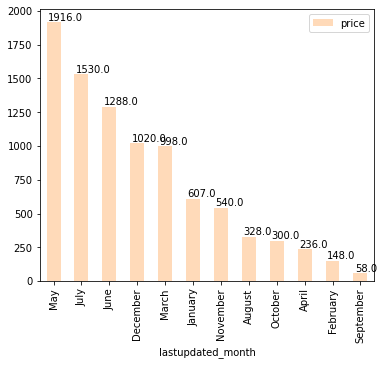

In [ ]:
ax = group_price.plot(kind='bar', figsize= (6,5), color= 'peachpuff')

for p in ax.patches:
   ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.05, p.get_height()+0.01), va= 'bottom')

plt.show()

In [ ]:
group_rating= pd.pivot_table(df.round(), values= 'rating', index= 'lastupdated_year',aggfunc= 'sum').sort_values(by=['rating'], ascending= False).head()
group_rating

,rating
lastupdated_year,
2018,27002.0
2017,6044.0
2016,2586.0
2015,1558.0
2014,755.0


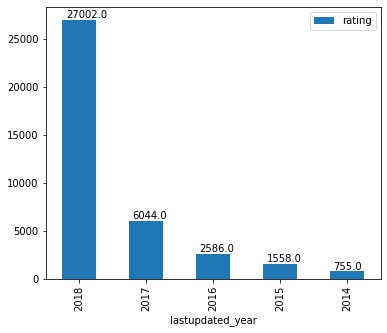

In [ ]:
ax = group_rating.plot(kind='bar', figsize= (6,5))

for p in ax.patches:
   ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.05, p.get_height()+0.01), va= 'bottom')

plt.show()

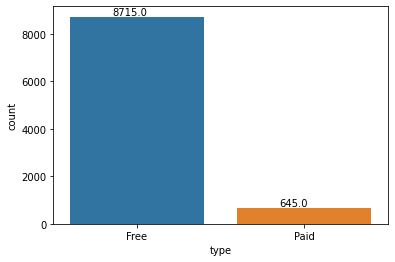

In [ ]:
ax = sns.countplot(df.type)

for p in ax.patches:
   ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01), va= 'bottom')

plt.show()

In [ ]:
bars = alt.Chart(df).mark_bar().encode(
    x='type',
    y='count(type)',
    color= 'type'
)

text = bars.mark_text(
    align='center',
    baseline='bottom',
    dx=3, 
).encode(
    text='count(type)'
)

(bars + text).properties(height=330, width=400)

alt.LayerChart(...)

In [ ]:
correlation= df.corr()
correlation

,rating,reviews,installs,price
rating,1.000000,0.068133,0.051337,-0.021919
reviews,0.068133,1.000000,0.641605,-0.009824
installs,0.051337,0.641605,1.000000,-0.011895
price,-0.021919,-0.009824,-0.011895,1.000000


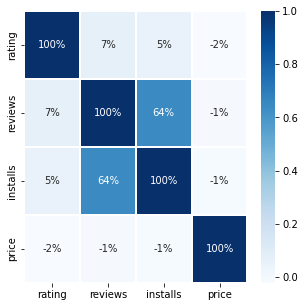

In [ ]:
plt.figure(figsize=(5,5))
ax= sns.heatmap(correlation,annot= True,linewidths= 1.5, fmt='.0%',cmap='Blues')
plt.show()

In [ ]:
!pip install statsmodels==0.13.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 87.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.7/233.7 KB 38.8 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
fig = px.scatter(df, x="installs", y="reviews", trendline= "ols", title= "Installs vs Reviews")
fig.show()

In [ ]:
df.head()

,app,category,rating,reviews,size,installs,type,price,content_rating,genres,last_updated,current_version,android_version,lastupdated_year,lastupdated_month
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,10000.0,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up,2018,January
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,500000.0,Free,0.0,Everyone,Art & Design;Pretend Play,2018-01-15,2.0.0,4.0.3 and up,2018,January
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,5000000.0,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up,2018,August
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,50000000.0,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up,2018,June
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,100000.0,Free,0.0,Everyone,Art & Design;Creativity,2018-06-20,1.1,4.4 and up,2018,June


In [ ]:
df['category'].nunique()

33

In [ ]:
df['category'].value_counts()\
              .head(10)\
              .to_frame(name= 'Count')\
              .reset_index()\
              .style.background_gradient(cmap= 'Greens', subset= 'Count')

,index,Count
0,FAMILY,1746
1,GAME,1097
2,TOOLS,733
3,PRODUCTIVITY,351
4,MEDICAL,350
5,COMMUNICATION,328
6,FINANCE,323
7,SPORTS,319
8,PHOTOGRAPHY,317
9,LIFESTYLE,314


In [ ]:
fig = px.pie(df, values='price', names='content_rating',
             
             title= 'Price Percentage For Types of App',hole = .3)
fig.show()

In [ ]:
fig = px.pie(df, values='price', names='type')
fig.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=08c8ba4b-5943-429a-aae9-5c2a6e037989' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>